# EDA Atfal Mafkoda

This EDA notebook will explore what some of the various images in the FFHQ dataset look like, what the age and gender distributions are, will start looking into things like removing photo backgrounds and using NVDIA DALI to encode images for training.

In [3]:
import pandas as pd
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
from IPython import display
from datasets import load_dataset,get_dataset_split_names,get_dataset_config_names, Image
import json
from tqdm import tqdm
from PIL import Image
import os

## FFHQ Image Data 

## Importing/Cleaning labels

In [1]:
!git clone https://github.com/DCGM/ffhq-features-dataset.git

Cloning into 'ffhq-features-dataset'...
remote: Enumerating objects: 69558, done.
remote: Total 69558 (delta 0), reused 0 (delta 0), pack-reused 69558
Receiving objects: 100% (69558/69558), 22.84 MiB | 31.58 MiB/s, done.
Resolving deltas: 100% (69474/69474), done.
Checking out files: 100% (70004/70004), done.


In [16]:
import os
i = 1
filenames = []
df = pd.DataFrame()
for f in tqdm(os.listdir("ffhq-features-dataset/json")):
    new = pd.read_json("ffhq-features-dataset/json/"+f)
    if (not new.empty) and (len(new) == 1):
        filenames.append(f)
        df = pd.concat([df, new])
    if len(df) != len(filenames):
        print(f)
        break
df = df.reset_index(drop=True)

100%|██████████| 70000/70000 [06:40<00:00, 174.62it/s]


In [17]:
df['filename'] = filenames

In [20]:
df

,faceId,faceRectangle,faceAttributes,filename
0,80a0462f-5d1a-4f29-b1e2-0f76dc9ed68f,"{'top': 41, 'left': 27, 'width': 72, 'height':...","{'smile': 0.0, 'headPose': {'pitch': -10.8, 'r...",69028.json
1,c88ab5b3-655a-4c6d-94a9-43920daa5a08,"{'top': 41, 'left': 26, 'width': 67, 'height':...","{'smile': 0.001, 'headPose': {'pitch': 1.5, 'r...",01554.json
2,cf300966-82eb-45d6-88c4-44801fa5c3c2,"{'top': 39, 'left': 27, 'width': 73, 'height':...","{'smile': 1.0, 'headPose': {'pitch': 7.6, 'rol...",50081.json
3,69550ced-b698-4921-ad44-89fa128e3e51,"{'top': 42, 'left': 31, 'width': 66, 'height':...","{'smile': 1.0, 'headPose': {'pitch': -1.700000...",50442.json
4,48229fef-eee8-4205-a80f-fa23e39fdd85,"{'top': 37, 'left': 23, 'width': 78, 'height':...","{'smile': 0.5, 'headPose': {'pitch': -6.4, 'ro...",31920.json
...,...,...,...,...
69396,7697fd50-e84a-44f1-be76-f26b2dcf7931,"{'top': 41, 'left': 29, 'width': 69, 'height':...","{'smile': 1.0, 'headPose': {'pitch': -7.6, 'ro...",13799.json
69397,4400ce66-d011-4b1a-9e8e-30eaf4a4b86a,"{'top': 40, 'left': 29, 'width': 67, 'height':...","{'smile': 1.0, 'headPose': {'pitch': -0.9, 'ro...",65107.json
69398,09554185-2b58-4311-8b3f-ec98461a1d81,"{'top': 39, 'left': 26, 'width': 76, 'height':...","{'smile': 1.0, 'headPose': {'pitch': -11.2, 'r...",47644.json
69399,22162cd9-2ead-404f-8c27-40be8c19ac7e,"{'top': 39, 'left': 28, 'width': 73, 'height':...","{'smile': 0.004, 'headPose': {'pitch': 1.2, 'r...",14992.json


In [22]:
att = pd.DataFrame.from_dict(df['faceAttributes'].to_dict()).T

In [24]:
df = pd.merge(df, att, left_on=df.index, right_on=att.index)
df = df.drop(columns=['key_0'])

In [27]:
df.to_csv("ffhq_im_att.csv")

In [5]:
df = pd.read_csv("ffhq_im_att.csv")
df

,Unnamed: 0,faceId,faceRectangle,faceAttributes,filename,smile,headPose,gender,age,facialHair,glasses,emotion,blur,exposure,noise,makeup,accessories,occlusion,hair
0,0,80a0462f-5d1a-4f29-b1e2-0f76dc9ed68f,"{'top': 41, 'left': 27, 'width': 72, 'height':...","{'smile': 0.0, 'headPose': {'pitch': -10.8, 'r...",69028.json,0.000,"{'pitch': -10.8, 'roll': 0.30000000000000004, ...",male,19.0,"{'moustache': 0.1, 'beard': 0.1, 'sideburns': ...",ReadingGlasses,"{'anger': 0.0, 'contempt': 0.001, 'disgust': 0...","{'blurLevel': 'medium', 'value': 0.47000000000...","{'exposureLevel': 'goodExposure', 'value': 0.72}","{'noiseLevel': 'low', 'value': 0.19}","{'eyeMakeup': False, 'lipMakeup': True}","[{'type': 'glasses', 'confidence': 0.97}]","{'foreheadOccluded': False, 'eyeOccluded': Fal...","{'bald': 0.01, 'invisible': False, 'hairColor'..."
1,1,c88ab5b3-655a-4c6d-94a9-43920daa5a08,"{'top': 41, 'left': 26, 'width': 67, 'height':...","{'smile': 0.001, 'headPose': {'pitch': 1.5, 'r...",01554.json,0.001,"{'pitch': 1.5, 'roll': 1.2, 'yaw': -55.6}",female,49.0,"{'moustache': 0.0, 'beard': 0.0, 'sideburns': ...",NoGlasses,"{'anger': 0.0, 'contempt': 0.0, 'disgust': 0.0...","{'blurLevel': 'low', 'value': 0.02}","{'exposureLevel': 'goodExposure', 'value': 0.5...","{'noiseLevel': 'low', 'value': 0.01}","{'eyeMakeup': True, 'lipMakeup': False}",[],"{'foreheadOccluded': False, 'eyeOccluded': Fal...","{'bald': 0.03, 'invisible': False, 'hairColor'..."
2,2,cf300966-82eb-45d6-88c4-44801fa5c3c2,"{'top': 39, 'left': 27, 'width': 73, 'height':...","{'smile': 1.0, 'headPose': {'pitch': 7.6, 'rol...",50081.json,1.000,"{'pitch': 7.6, 'roll': 0.1, 'yaw': -11.1}",female,27.0,"{'moustache': 0.0, 'beard': 0.0, 'sideburns': ...",NoGlasses,"{'anger': 0.0, 'contempt': 0.0, 'disgust': 0.0...","{'blurLevel': 'low', 'value': 0.12}","{'exposureLevel': 'goodExposure', 'value': 0.68}","{'noiseLevel': 'low', 'value': 0.14}","{'eyeMakeup': True, 'lipMakeup': False}",[],"{'foreheadOccluded': False, 'eyeOccluded': Fal...","{'bald': 0.03, 'invisible': False, 'hairColor'..."
3,3,69550ced-b698-4921-ad44-89fa128e3e51,"{'top': 42, 'left': 31, 'width': 66, 'height':...","{'smile': 1.0, 'headPose': {'pitch': -1.700000...",50442.json,1.000,"{'pitch': -1.7000000000000002, 'roll': 3.4, 'y...",female,18.0,"{'moustache': 0.0, 'beard': 0.0, 'sideburns': ...",NoGlasses,"{'anger': 0.0, 'contempt': 0.0, 'disgust': 0.0...","{'blurLevel': 'medium', 'value': 0.30000000000...","{'exposureLevel': 'overExposure', 'value': 0.76}","{'noiseLevel': 'low', 'value': 0.04}","{'eyeMakeup': False, 'lipMakeup': False}",[],"{'foreheadOccluded': False, 'eyeOccluded': Fal...","{'bald': 0.05, 'invisible': False, 'hairColor'..."
4,4,48229fef-eee8-4205-a80f-fa23e39fdd85,"{'top': 37, 'left': 23, 'width': 78, 'height':...","{'smile': 0.5, 'headPose': {'pitch': -6.4, 'ro...",31920.json,0.500,"{'pitch': -6.4, 'roll': -0.2, 'yaw': -18.3}",male,17.0,"{'moustache': 0.1, 'beard': 0.1, 'sideburns': ...",NoGlasses,"{'anger': 0.0, 'contempt': 0.498, 'disgust': 0...","{'blurLevel': 'high', 'value': 1.0}","{'exposureLevel': 'overExposure', 'value': 0.76}","{'noiseLevel': 'low', 'value': 0.0}","{'eyeMakeup': False, 'lipMakeup': False}",[],"{'foreheadOccluded': False, 'eyeOccluded': Fal...","{'bald': 0.01, 'invisible': False, 'hairColor'..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69396,69396,7697fd50-e84a-44f1-be76-f26b2dcf7931,"{'top': 41, 'left': 29, 'width': 69, 'height':...","{'smile': 1.0, 'headPose': {'pitch': -7.6, 'ro...",13799.json,1.000,"{'pitch': -7.6, 'roll': -1.0, 'yaw': 1.5}",male,22.0,"{'moustache': 0.1, 'beard': 0.1, 'sideburns': ...",NoGlasses,"{'anger': 0.0, 'contempt': 0.0, 'disgust': 0.0...","{'blurLevel': 'low', 'value': 0.09}","{'exposureLevel': 'goodExposure', 'value': 0.59}","{'noiseLevel': 'low', 'value': 0.0}","{'eyeMakeup': False, 'lipMakeup': False}","[{'type': 'headwear', 'confidence': 0.99}]","{'foreheadOccluded': True, 'eyeOccluded': Fals...","{'bald': 0.0, '

## Visualize Images

In [7]:
df['dir'] = df['filename'].apply(lambda x: x[:2]+'000')
df['file'] = df['filename'].apply(lambda x: x[:5])
df['age'] = df['age'].astype(int)

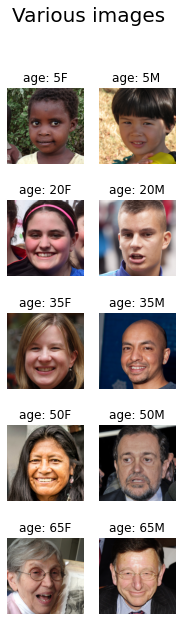

In [8]:
%matplotlib inline
import matplotlib.image as mpimg
plt.rcParams["axes.grid"] = False

fig, axes = plt.subplots(5, 2, figsize=(3, 10))
plt.suptitle('Various images', fontsize=20)

attributes=['age','gender','dir','file']
ages = list(range(5,75,15))
for i, age in enumerate(ages):
    
    # female
    a, gen, direc, fil = df[(df['age'] == age) & (df['gender'] == 'female')].iloc[1][attributes]
    img = mpimg.imread("images1024x1024/" + direc + "/" + fil + ".png") #Ex: "images1024x1024/50000/50442.png"
    axes[i][0].imshow(img) 
    axes[i][0].set_title(f'age: {a}F')
    axes[i][0].axis('off')
    
    # male
    a, gen, direc, fil = df[(df['age'] == age) & (df['gender'] == 'male')].iloc[1][attributes] # alter .iloc[n] for different results
    img = mpimg.imread("images1024x1024/" + direc + "/" + fil + ".png")
    axes[i][1].imshow(img) 
    axes[i][1].set_title(f'age: {a}M')
    axes[i][1].axis('off')

## Unique IDs FFHQ

In [9]:
df['faceId'].value_counts()

021b3f1f-c80b-42b2-b823-72a67865b490    1
447005e9-097f-4768-85ae-ca2cea9c8b27    1
6e6499d1-c09f-41a2-9da9-1a9f43f3b8a4    1
c4f08f48-6fd9-49c2-a92d-d03a12c220b2    1
dcbbfaa3-af0c-4e4e-98d8-efbf5e8247d7    1
                                       ..
f555b319-5db9-4392-98b1-6835e369fc1f    1
b959bb36-8010-45a5-af50-6bfdc68a7919    1
addd78b9-d97b-4fa6-a310-a68e06f5c733    1
f4dd4b28-f0be-4be8-99de-2e088028770a    1
cd4124c9-636e-4060-9b56-b1a75bfdf51d    1
Name: faceId, Length: 69401, dtype: int64

## Distribution of Gender FFHQ

Finding the gender distribution is important because we will likely have two different models one for males and one for females.

In [10]:
df['gender'].describe()

count      69401
unique         2
top       female
freq       38356
Name: gender, dtype: object

<AxesSubplot:xlabel='gender', ylabel='count'>

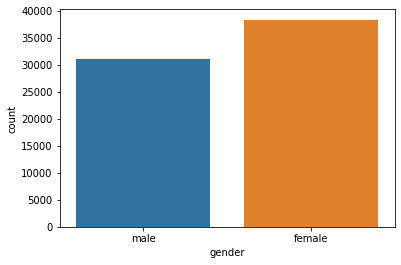

In [11]:
sns.countplot(x='gender', data=df)

## Distribution of Ages FFHQ

general age distribution

In [19]:
df['age'].describe()

count    69401.000000
mean        29.532456
std         15.868147
min          0.000000
25%         20.000000
50%         29.000000
75%         39.000000
max         72.000000
Name: age, dtype: float64

Text(0.5, 1.0, 'Age Distribution of FFHQ Data')

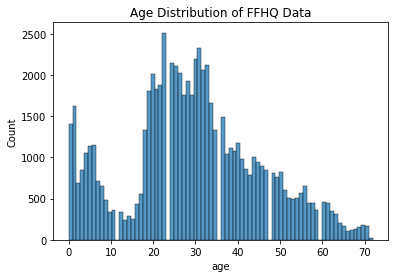

In [14]:
sns.histplot(x='age', data=df)
plt.title("Age Distribution of FFHQ Data")

Age distribution for each gender

In [27]:
female = df[df['gender'] == 'female']
male = df[df['gender'] == 'male']

count    38356.000000
mean        26.268693
std         13.881970
min          0.000000
25%         19.000000
50%         25.000000
75%         34.000000
max         72.000000
Name: age, dtype: float64


Text(0.5, 1.0, 'Female Age Distribution of FFHQ Data')

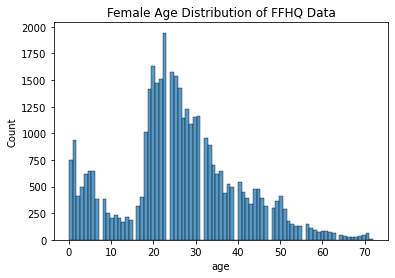

In [31]:
#female age dist
print(female['age'].describe())
sns.histplot(x='age', data=female)
plt.title("Female Age Distribution of FFHQ Data")

count    31045.000000
mean        33.564825
std         17.186893
min          0.000000
25%         24.000000
50%         33.000000
75%         46.000000
max         72.000000
Name: age, dtype: float64


Text(0.5, 1.0, 'Male Age Distribution of FFHQ Data')

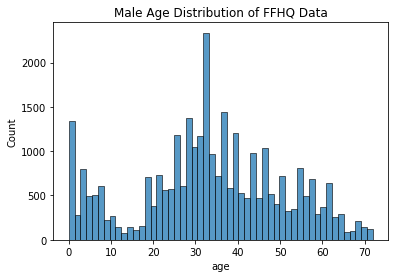

In [30]:
#male age dist
print(male['age'].describe())
sns.histplot(x='age', data=male)
plt.title("Male Age Distribution of FFHQ Data")

## Adience Dataset

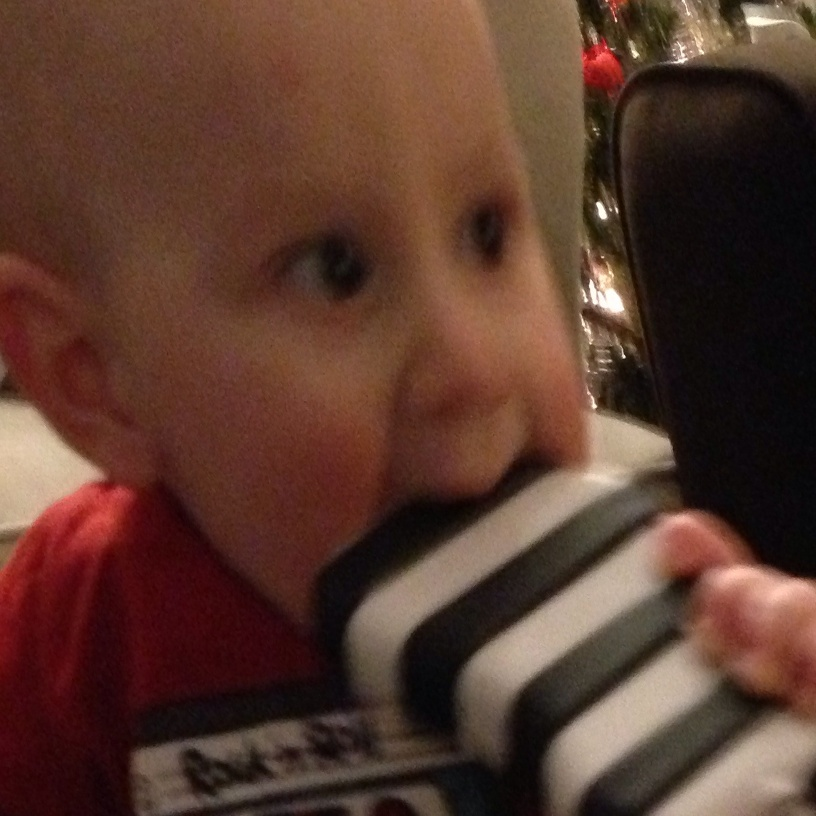

In [35]:
display.Image("Adience-Data/m/0_2/8863510428_6895971a5a_o.jpg", width = 300, height = 300)

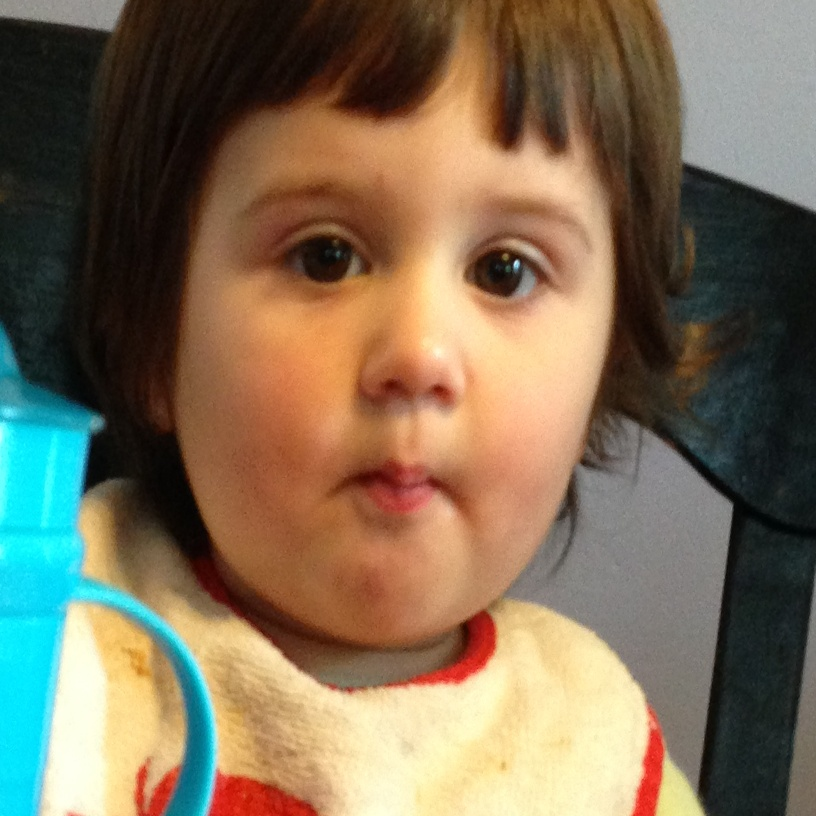

In [36]:
display.Image("Adience-Data/f/0_2/8652394616_ae51de0079_o.jpg", width = 300, height = 300)

#### We will not be using this data because the FFHQ dataset is of much higher quality

## Fairface Dataset

In [12]:
dataset = load_dataset("HuggingFaceM4/FairFace",cache_dir = '/projectnb/sparkgrp/ml-atfal-mafkoda-grp/FairFace')

No config specified, defaulting to: fair_face/0.25
Found cached dataset fair_face (/projectnb/sparkgrp/ml-atfal-mafkoda-grp/FairFace/HuggingFaceM4___fair_face/0.25/1.0.0/911f172b84f85947043eeca099b4af3358f10dcd579602930d0aeb119e5ce095)


  0%|          | 0/2 [00:00<?, ?it/s]

In [13]:
configs = get_dataset_config_names("HuggingFaceM4/FairFace")
print(configs)
get_dataset_split_names("HuggingFaceM4/FairFace")

['0.25', '1.25']


No config specified, defaulting to: fair_face/0.25


['train', 'validation']

In [14]:
dataset

DatasetDict({
    train: Dataset({
        features: ['image', 'age', 'gender', 'race', 'service_test'],
        num_rows: 86744
    })
    validation: Dataset({
        features: ['image', 'age', 'gender', 'race', 'service_test'],
        num_rows: 10954
    })
})

In [15]:
train_data = load_dataset('HuggingFaceM4/FairFace', '0.25',split = 'train',cache_dir = '/projectnb/sparkgrp/ml-atfal-mafkoda-grp/FairFace')

Found cached dataset fair_face (/projectnb/sparkgrp/ml-atfal-mafkoda-grp/FairFace/HuggingFaceM4___fair_face/0.25/1.0.0/911f172b84f85947043eeca099b4af3358f10dcd579602930d0aeb119e5ce095)


In [16]:
train_data

Dataset({
    features: ['image', 'age', 'gender', 'race', 'service_test'],
    num_rows: 86744
})

In [17]:
race_dict = {0:'East Asian',1:'Indian',2:'Black',3:'White',4:'Middle Eastern',5:'Latino_Hispanic',6:'Southeast Asian'}

# taken from https://keestalkstech.com/2020/05/plotting-a-grid-of-pil-images-in-jupyter/
def display_images(
    images, 
    columns=5, width=20, height=8, max_images=20, 
    label_wrap_length=50, label_font_size=8):

    if not images:
        print("No images to display.")
        return 

    if len(images) > max_images:
        print(f"Showing {max_images} images of {len(images)}:")
        images=images[0:max_images]

    height = max(height, int(len(images)/columns) * height)
    plt.figure(figsize=(width, height))
    for i, image in enumerate(images):

        plt.subplot(int(len(images) / columns + 1), columns, i + 1)
        plt.imshow(image)

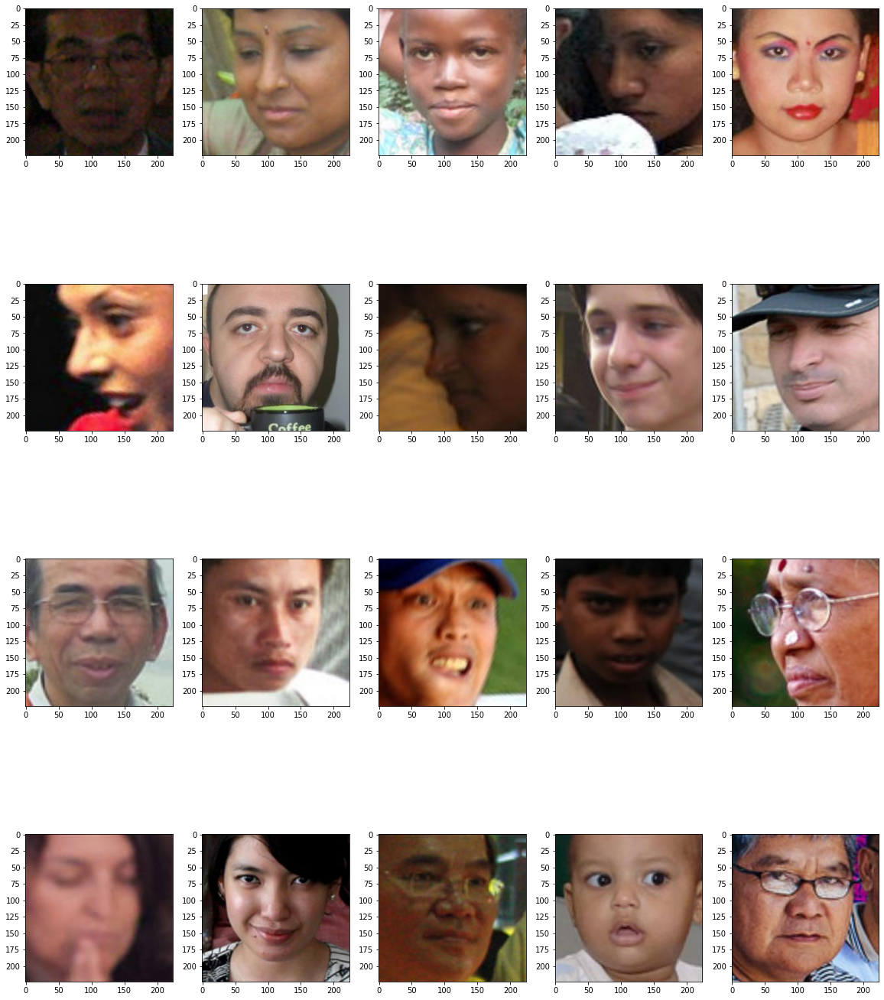

In [18]:
display_images(train_data[0:20]['image'])

Text(0.5, 1.0, 'Race Counts')

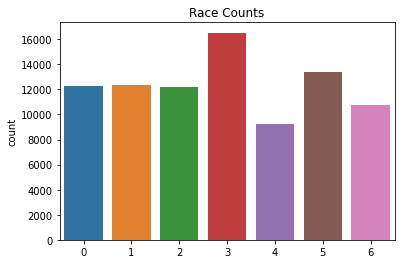

In [27]:
sns.countplot(x=train_data['race'])
plt.title("Race Counts")
# {0:'East Asian',1:'Indian',2:'Black',3:'White',4:'Middle Eastern',5:'Latino_Hispanic',6:'Southeast Asian'}

In [20]:
ME_data = train_data.filter(lambda train_data: train_data['race'] == 4)

Loading cached processed dataset at /projectnb/sparkgrp/ml-atfal-mafkoda-grp/FairFace/HuggingFaceM4___fair_face/0.25/1.0.0/911f172b84f85947043eeca099b4af3358f10dcd579602930d0aeb119e5ce095/cache-bebe8728cbffe8e3.arrow


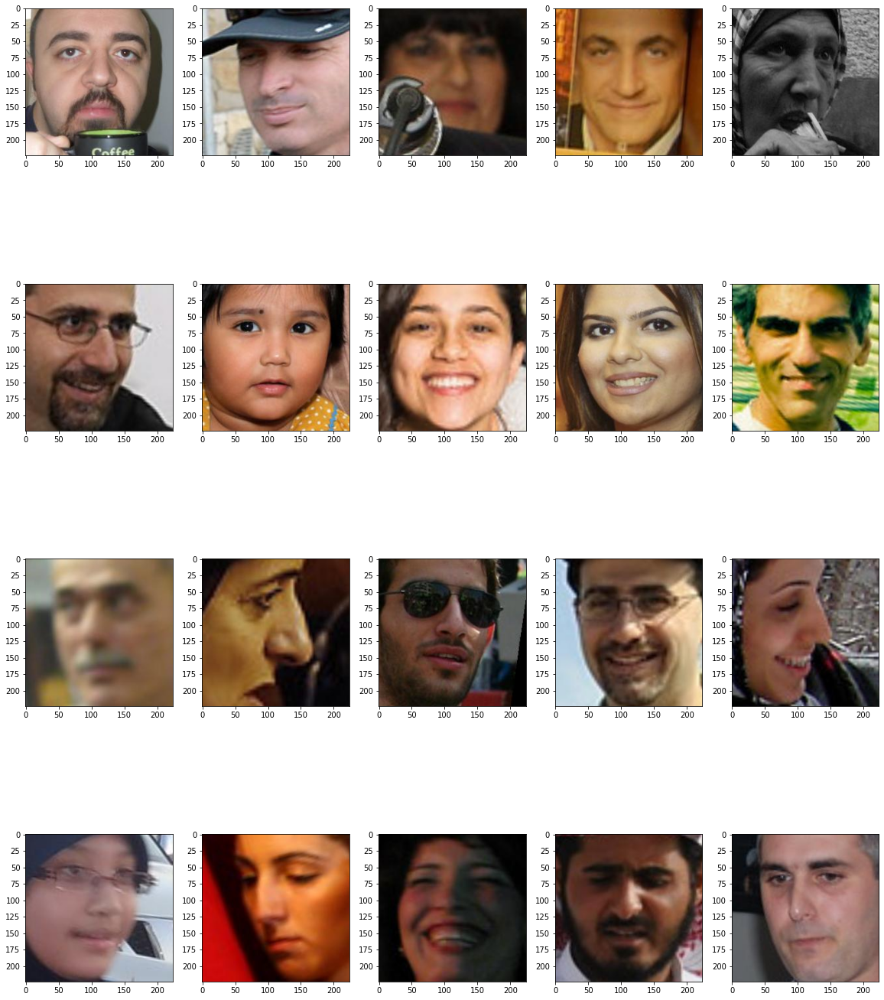

In [21]:
display_images(ME_data[0:20]['image'])

[Text(0.5, 1.0, 'Middle Eastern Age Distribution')]

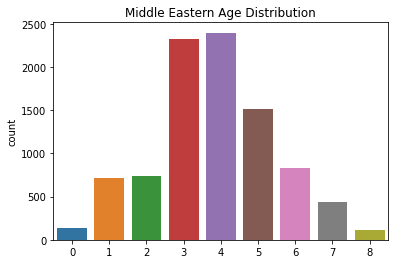

In [22]:
sns.countplot(x=ME_data['age']).set(title ='Middle Eastern Age Distribution')

[Text(0.5, 1.0, 'Train Data Age Distribution')]

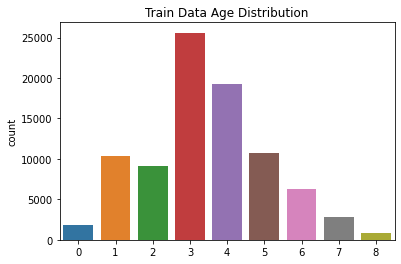

In [23]:
sns.countplot(x = train_data['age']).set(title= 'Train Data Age Distribution')

## Exploring background removal

In [28]:
from rembg import remove
import cv2
from skimage import color
from skimage import io

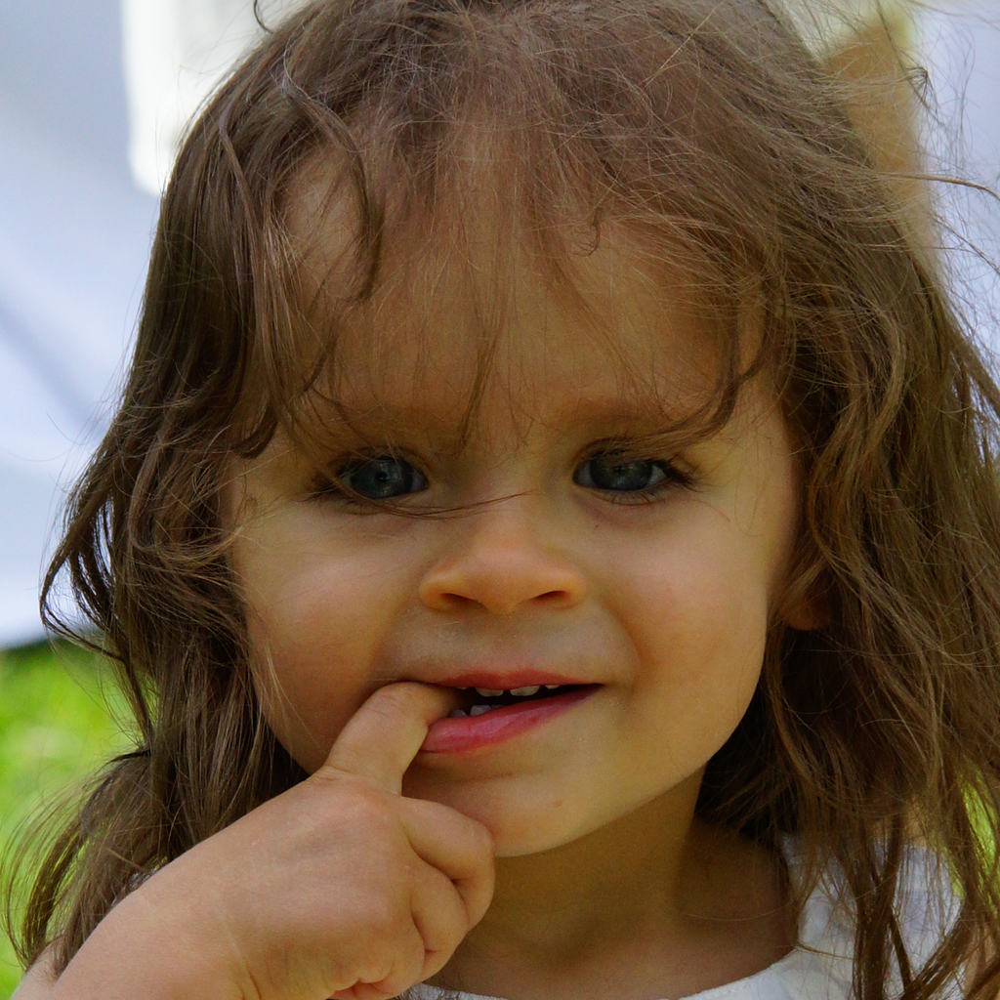

In [29]:
display.Image("images1024x1024/02000/02003.png", width = 300, height = 300)

In [30]:
input_path = "images1024x1024/02000/02003.png"
input = Image.open(input_path)
output = remove(input)

100%|████████████████████████████████████████| 176M/176M [00:00<00:00, 280GB/s]


In [31]:
output.thumbnail((300, 300))

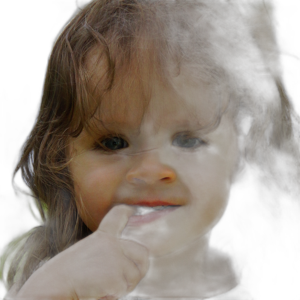

In [32]:
output

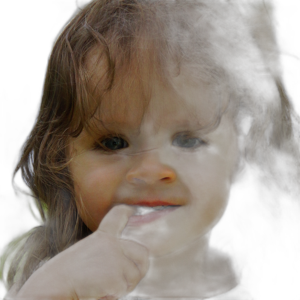

In [33]:
input_path = "images1024x1024/02000/02003.png"
input = Image.open(input_path)

output = remove(input)
output.thumbnail((300, 300))
output

In [34]:
img= Image.open("images1024x1024/02000/02003.png")
np_img = np.array(img)

alpha = 2 # Contrast control
beta = 0.15 # Brightness control

data = cv2.convertScaleAbs(np_img, alpha = alpha, beta = beta)

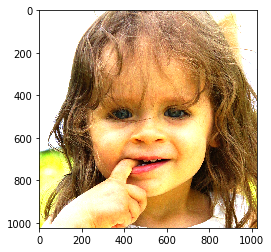

In [35]:
plt.imshow(data, interpolation='nearest')
plt.show()

In [36]:
im = Image.fromarray(data)
im.save("test_remove_background/test1_contrast.png")

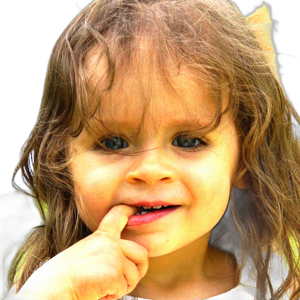

In [37]:
input_path = "test_remove_background/test1_contrast.png"
input = Image.open(input_path)
output3 = remove(input)
output3.thumbnail((300, 300))
output3

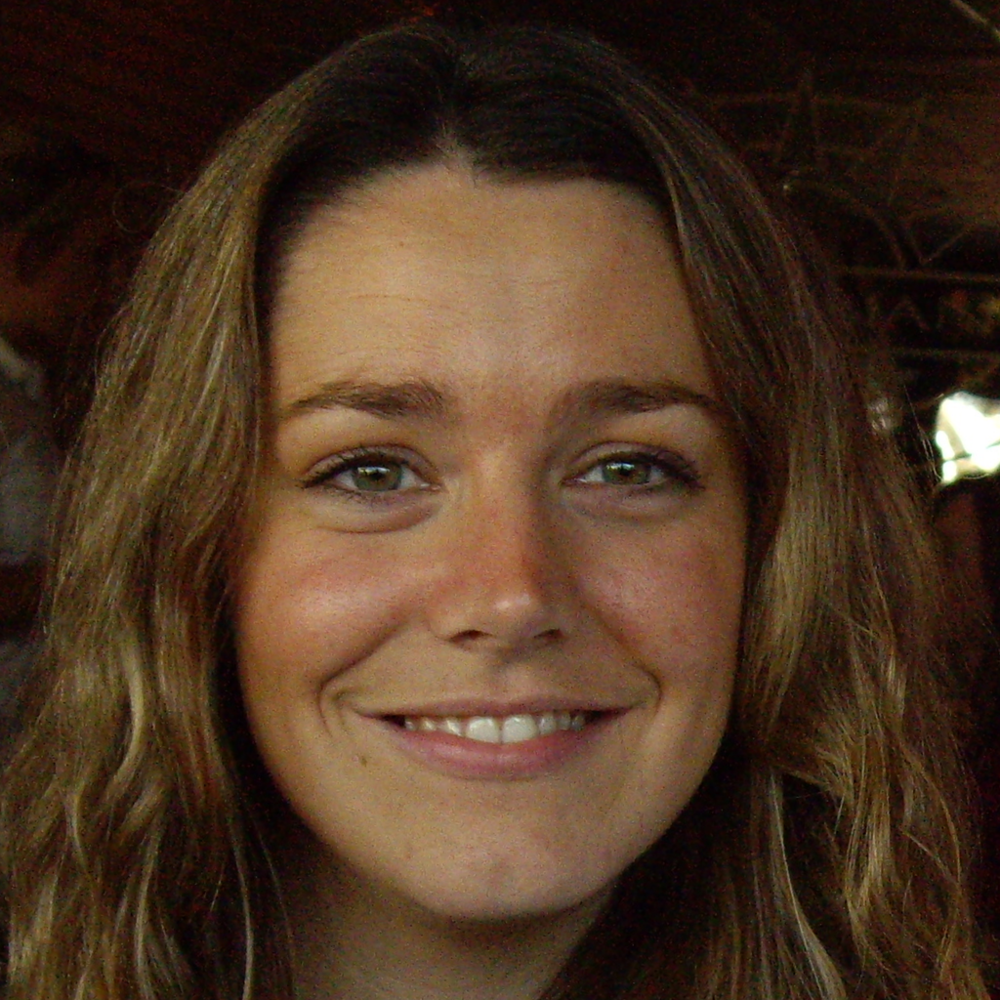

In [38]:
display.Image("images1024x1024/02000/02005.png", width = 300, height = 300)

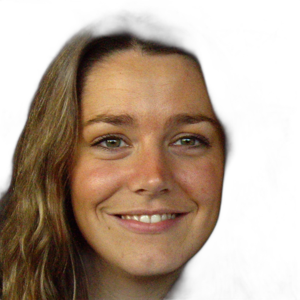

In [39]:
img= Image.open("images1024x1024/02000/02005.png")
np_img = np.array(img)

alpha = 1.2 # Contrast control
beta = 0.5 # Brightness control

data = cv2.convertScaleAbs(np_img, alpha = alpha, beta = beta)
im = Image.fromarray(data)
im.save("test_remove_background/test2_contrast.png")
input_path = "test_remove_background/test2_contrast.png"
input = Image.open(input_path)
output5 = remove(input)
output5.thumbnail((300, 300))
output5

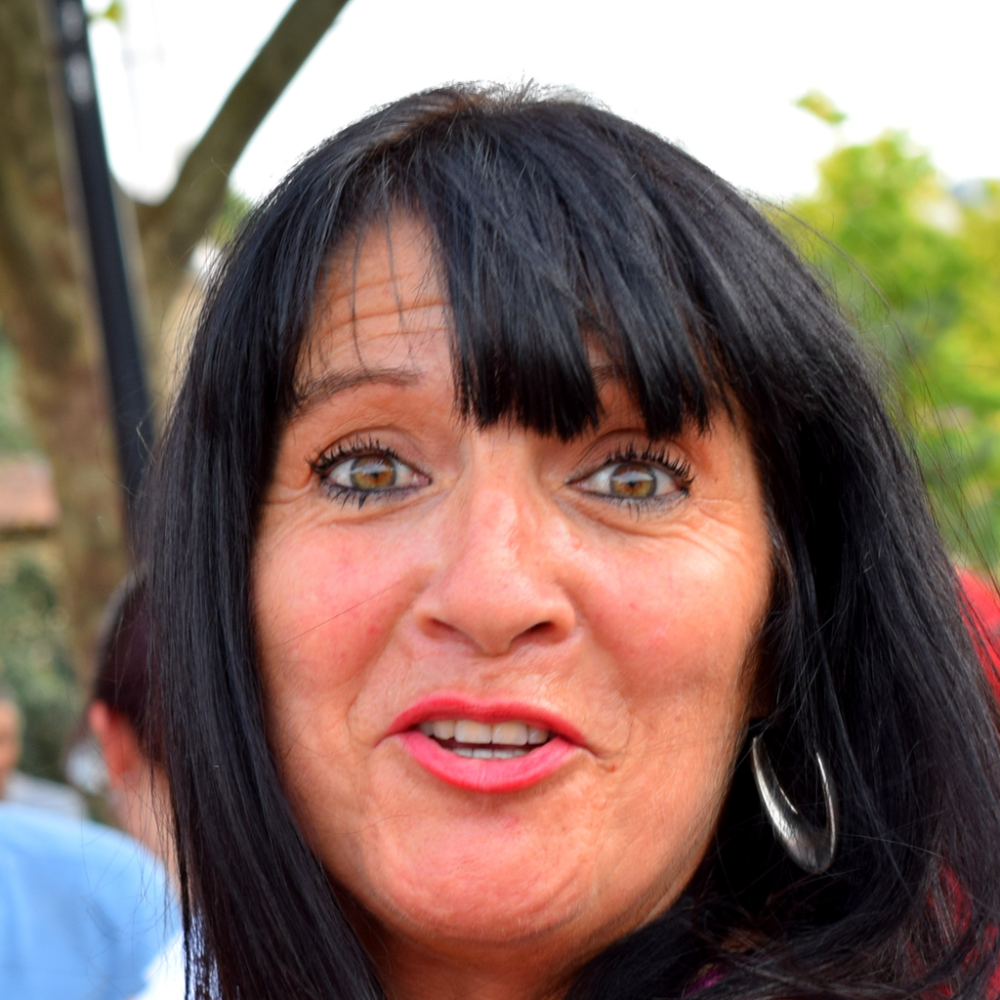

In [40]:
display.Image("images1024x1024/02000/02000.png", width = 300, height = 300)

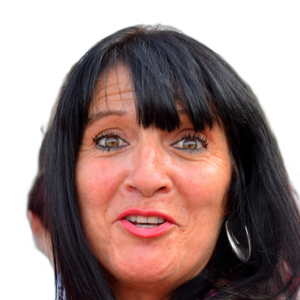

In [41]:
input_path = "images1024x1024/02000/02000.png"
input = Image.open(input_path)
output2 = remove(input)
output2.thumbnail((300, 300))
output2

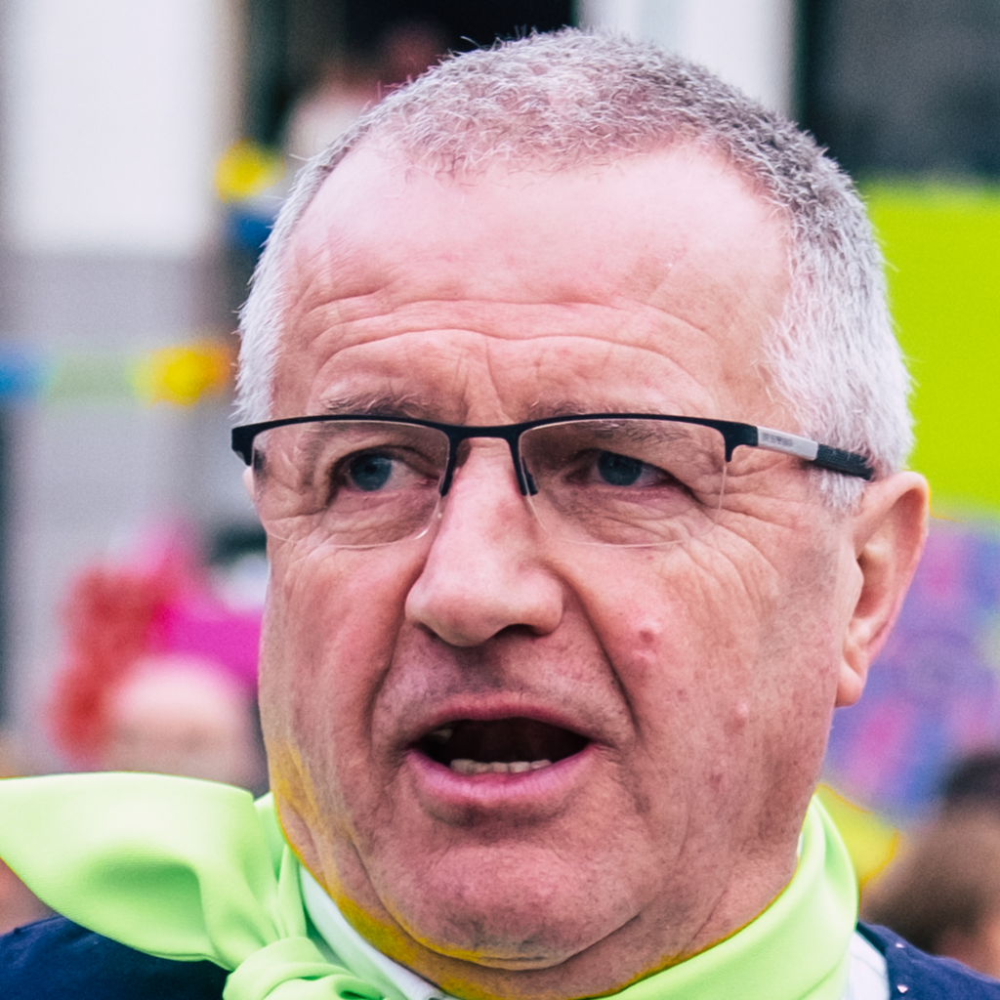

In [42]:
display.Image("images1024x1024/02000/02006.png", width = 300, height = 300)

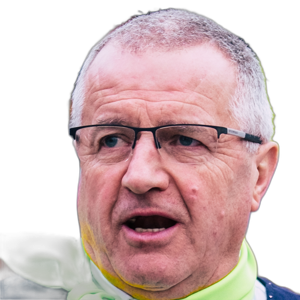

In [43]:
input_path = "images1024x1024/02000/02006.png"
input = Image.open(input_path)
output4 = remove(input)
output4.thumbnail((300, 300))
output4

## Unlabeled Atfal Mafkoda Data 

In [44]:
os.listdir("atfalmafkoda_unzip")

['found children',
 'missing people',
 'found babies',
 'special needs',
 '.DS_Store',
 'homeless',
 'egyptian faces 2',
 'missing children',
 'egyptian faces']

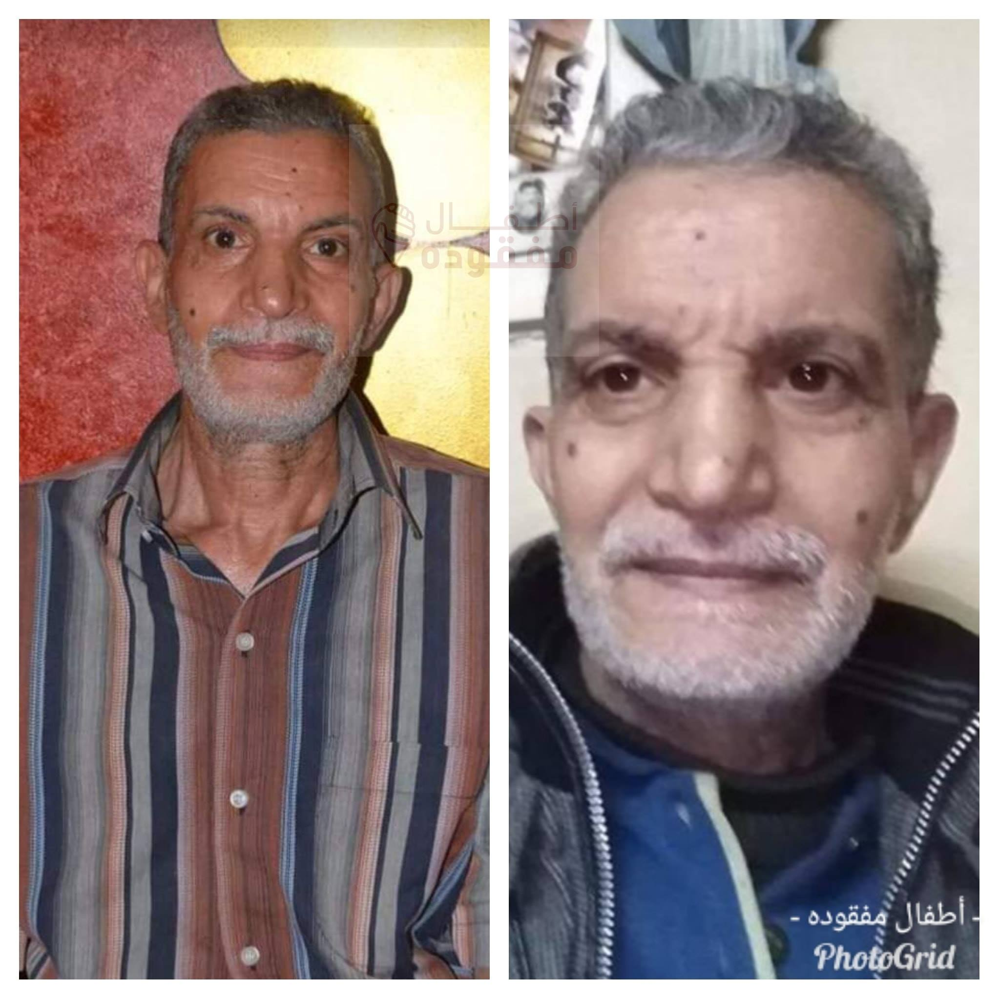

In [66]:
import random 

f = random.choice(os.listdir("atfalmafkoda_unzip/missing people"))
display.Image("atfalmafkoda_unzip/missing people/"+f)


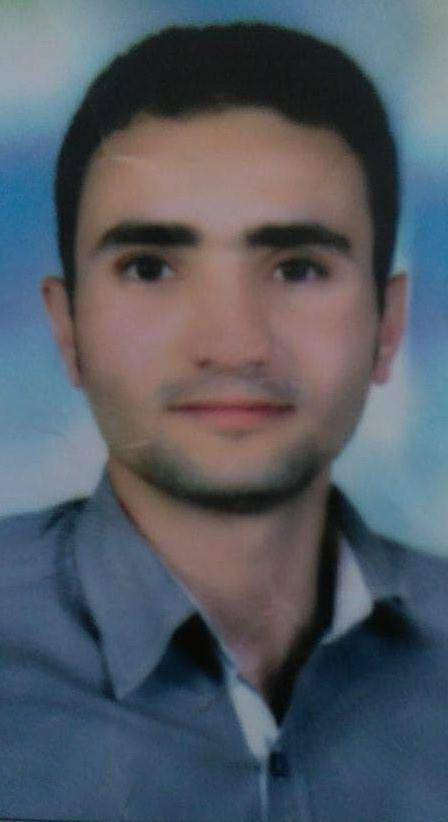

In [67]:
f = random.choice(os.listdir("atfalmafkoda_unzip/missing people"))
display.Image("atfalmafkoda_unzip/missing people/"+f)

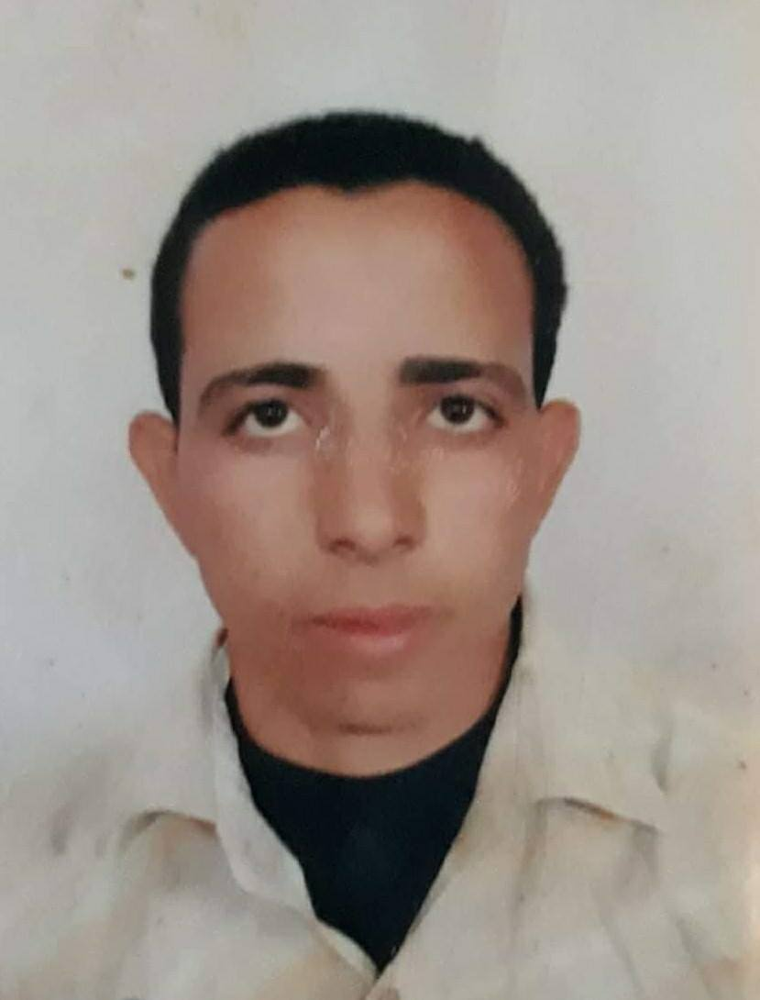

In [68]:
f = random.choice(os.listdir("atfalmafkoda_unzip/missing people"))
display.Image("atfalmafkoda_unzip/missing people/"+f)

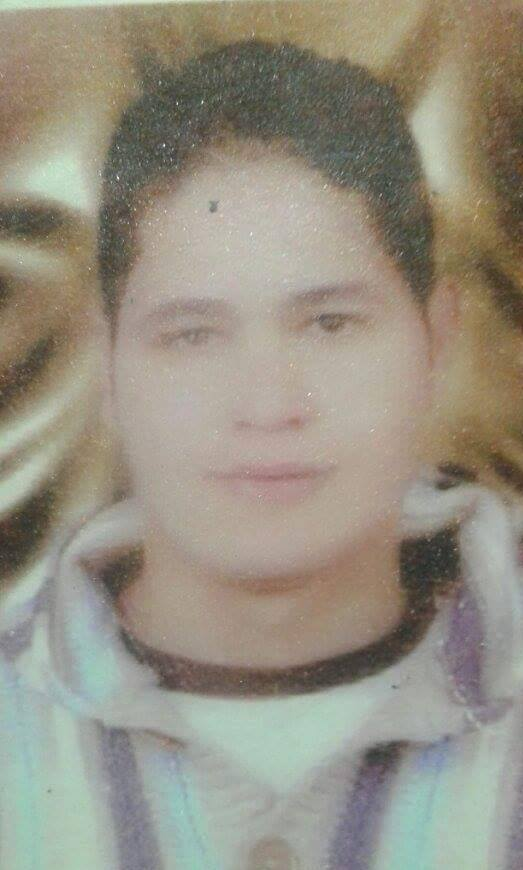

In [69]:
f = random.choice(os.listdir("atfalmafkoda_unzip/missing people"))
display.Image("atfalmafkoda_unzip/missing people/"+f)

## Next Steps

1. DaLI encoding